### Importación de datos



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


#1. Análisis de facturación



---

  ## 1.1. Gráfico de ingresos totales por tienda:  
  Muestra los ingresos totales de las cuatro tiendas, considerando el precio de los productos vendidos.

---

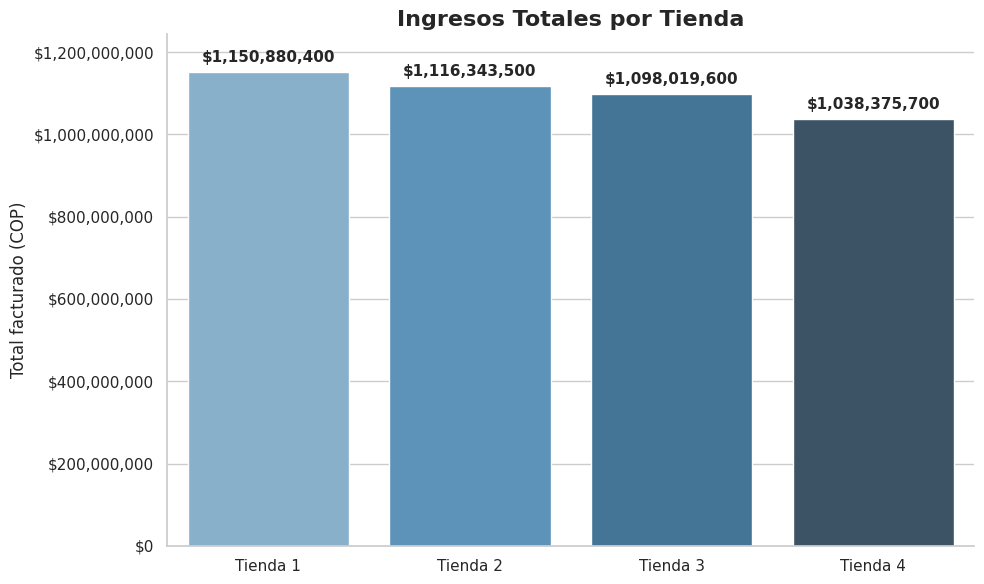

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker

# Calcular facturación sumando Precio por tienda
facturacion_tiendas = {
    'Tienda 1': tienda['Precio'].sum(),
    'Tienda 2': tienda2['Precio'].sum(),
    'Tienda 3': tienda3['Precio'].sum(),
    'Tienda 4': tienda4['Precio'].sum()
}

# Convertir a DataFrame
fact_df = pd.DataFrame({
    'Tienda': list(facturacion_tiendas.keys()),
    'Ingresos Totales (COP)': list(facturacion_tiendas.values())
})

# Estilo
sns.set_theme(style="whitegrid", rc={"figure.figsize": (10,6), "font.size": 12})

# Paleta degradada azul
palette = sns.color_palette("Blues_d", n_colors=len(fact_df))

# Plot
ax = sns.barplot(
    x="Tienda",
    y="Ingresos Totales (COP)",
    data=fact_df,
    hue="Tienda",       # Para evitar warning
    palette=palette,
    dodge=False,
    legend=False         # Ocultar leyenda redundante
)

# Formato eje Y con separador de miles y $
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Ajustar límite superior para etiquetas
ymax = fact_df["Ingresos Totales (COP)"].max() * 1.08
ax.set_ylim(0, ymax)

# Etiquetas arriba de cada barra
for p in ax.patches:
    height = p.get_height()
    ax.annotate(
        f'${height:,.0f}',
        (p.get_x() + p.get_width() / 2, height),
        ha='center', va='bottom',
        fontsize=11, fontweight='bold',
        xytext=(0, 5),
        textcoords='offset points'
    )

# Títulos y etiquetas
ax.set_title("Ingresos Totales por Tienda", fontsize=16, fontweight='bold')
ax.set_xlabel("")
ax.set_ylabel("Total facturado (COP)", fontsize=12)

# Quitar spines innecesarios
sns.despine(top=True, right=True, left=False, bottom=False)

plt.tight_layout()
plt.show()


---

  ## 1.2. Gráfico de desglose de ingresos por tienda: Precio vs costo de envío:  
  Muestra los ingresos totales combinados de las cuatro tiendas de Alura Store, considerando tanto el precio de los productos vendidos como el costo de envío.

---

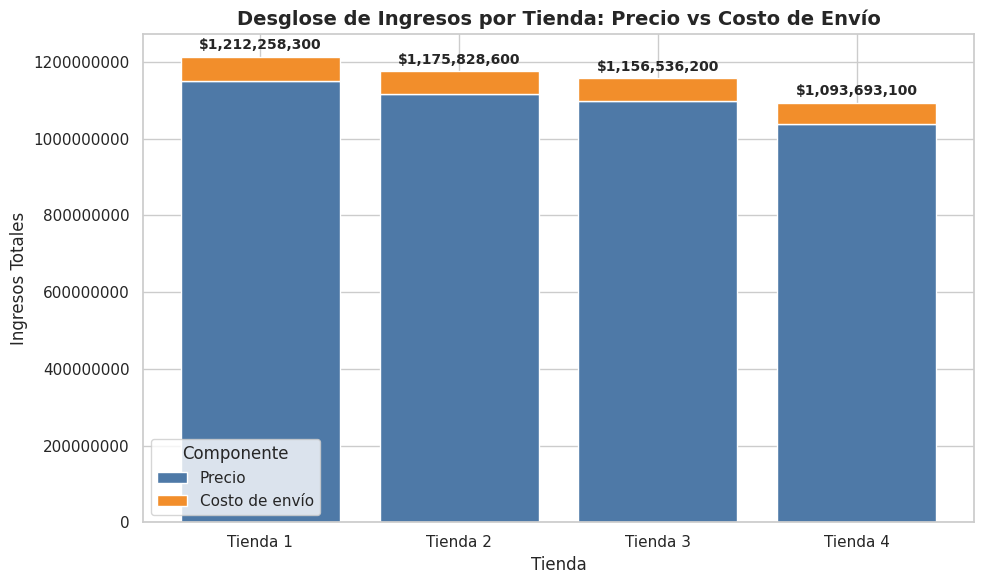

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calcular sumas por tienda para Precio y Costo de envío
datos_facturacion = {
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Precio': [
        tienda['Precio'].sum(),
        tienda2['Precio'].sum(),
        tienda3['Precio'].sum(),
        tienda4['Precio'].sum()
    ],
    'Costo de envío': [
        tienda['Costo de envío'].sum(),
        tienda2['Costo de envío'].sum(),
        tienda3['Costo de envío'].sum(),
        tienda4['Costo de envío'].sum()
    ]
}

# Convertir a DataFrame
df_facturacion = pd.DataFrame(datos_facturacion)

# Configuración estética
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10,6))

# Plot barras apiladas
plt.bar(df_facturacion['Tienda'], df_facturacion['Precio'], label='Precio', color='#4e79a7')
plt.bar(df_facturacion['Tienda'], df_facturacion['Costo de envío'], bottom=df_facturacion['Precio'], label='Costo de envío', color='#f28e2b')

# Añadir etiquetas y título
plt.title('Desglose de Ingresos por Tienda: Precio vs Costo de Envío', fontsize=14, fontweight='bold')
plt.ylabel('Ingresos Totales', fontsize=12)
plt.xlabel('Tienda')
plt.ticklabel_format(style='plain', axis='y')  # evita notación científica en eje y
plt.legend(title='Componente')

# Etiquetas con valores encima de las barras (total por tienda)
totales = df_facturacion['Precio'] + df_facturacion['Costo de envío']
for i, total in enumerate(totales):
    plt.text(i, total + total*0.01, f"${total:,.0f}", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()


# 2. Ventas por categoría
---

  ## 2.1. Gráfico: Cantidad de productos vendidos por categoría y tienda
  Muestra la cantidad de productos vendidos por categoría y tienda, con énfasis en la categoría más popular de cada tienda.

---

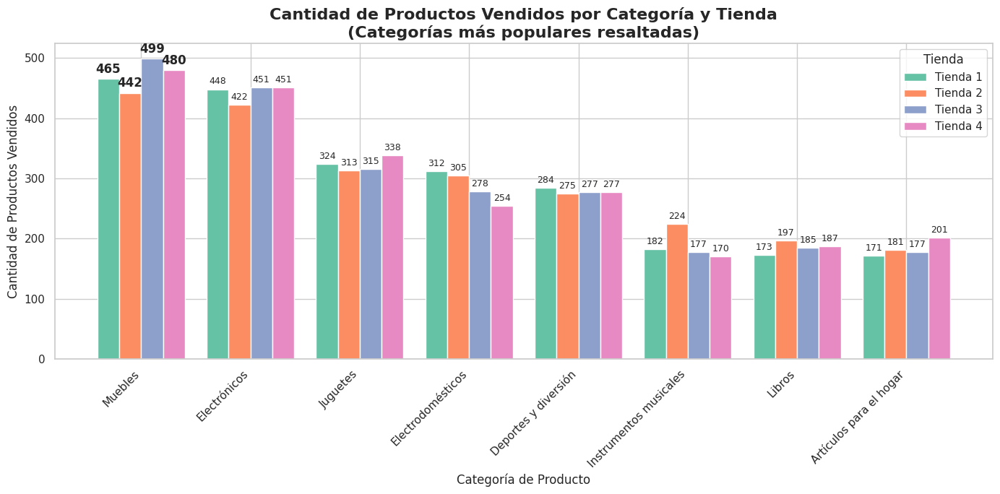

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Contar cantidad de productos vendidos por categoría en cada tienda
ventas_tienda1 = tienda['Categoría del Producto'].value_counts().reset_index()
ventas_tienda1.columns = ['Categoría', 'Cantidad']
ventas_tienda1['Tienda'] = 'Tienda 1'

ventas_tienda2 = tienda2['Categoría del Producto'].value_counts().reset_index()
ventas_tienda2.columns = ['Categoría', 'Cantidad']
ventas_tienda2['Tienda'] = 'Tienda 2'

ventas_tienda3 = tienda3['Categoría del Producto'].value_counts().reset_index()
ventas_tienda3.columns = ['Categoría', 'Cantidad']
ventas_tienda3['Tienda'] = 'Tienda 3'

ventas_tienda4 = tienda4['Categoría del Producto'].value_counts().reset_index()
ventas_tienda4.columns = ['Categoría', 'Cantidad']
ventas_tienda4['Tienda'] = 'Tienda 4'

# Concatenar todo en un solo DataFrame para graficar
df_ventas = pd.concat([ventas_tienda1, ventas_tienda2, ventas_tienda3, ventas_tienda4])

# Encontrar la categoría más popular por tienda
maximos_por_tienda = df_ventas.groupby('Tienda')['Cantidad'].transform('max')
df_ventas['Es_maximo'] = df_ventas['Cantidad'] == maximos_por_tienda

# Preparar gráfico
sns.set_theme(style="whitegrid")

# Obtener lista única de categorías (ordenadas)
categorias = df_ventas['Categoría'].unique()
tiendas = df_ventas['Tienda'].unique()

# Crear posición de barras
bar_width = 0.2
x = np.arange(len(categorias))

fig, ax = plt.subplots(figsize=(14,7))  # Crear figura y ejes

# Paleta para tiendas
palette = sns.color_palette('Set2', n_colors=len(tiendas))

for i, t in enumerate(tiendas):
    datos = df_ventas[df_ventas['Tienda'] == t]
    posiciones = x - bar_width*1.5 + i*bar_width
    # Asegurarse de que todas las categorías estén presentes
    cantidades = datos.set_index('Categoría').reindex(categorias)['Cantidad'].fillna(0)
    ax.bar(posiciones, cantidades, width=bar_width, label=t, color=palette[i])

    # Añadir etiquetas con resaltado para categoría más popular
    for j, cat in enumerate(categorias):
        cantidad = datos.loc[datos['Categoría'] == cat, 'Cantidad']
        if cantidad.empty:
            continue
        cantidad = int(cantidad.values[0])
        es_max = datos.loc[datos['Categoría'] == cat, 'Es_maximo'].values[0]
        fontsize = 12 if es_max else 9
        fontweight = 'bold' if es_max else 'normal'
        ax.text(posiciones[j], cantidad + df_ventas['Cantidad'].max() * 0.01,
                f'{cantidad}', ha='center', va='bottom',
                fontsize=fontsize, fontweight=fontweight)

ax.set_xticks(x)
ax.set_xticklabels(categorias, rotation=45, ha='right')
ax.set_xlabel('Categoría de Producto')
ax.set_ylabel('Cantidad de Productos Vendidos')
ax.set_title('Cantidad de Productos Vendidos por Categoría y Tienda\n(Categorías más populares resaltadas)',
             fontsize=16, fontweight='bold')
ax.legend(title='Tienda')
plt.tight_layout()
plt.show()


---

  ## 2.2. Gráfico de distribución porcentual de ventas por categoría
  Muestra la distribución porcentual de ventas dentro de cada tienda.

---

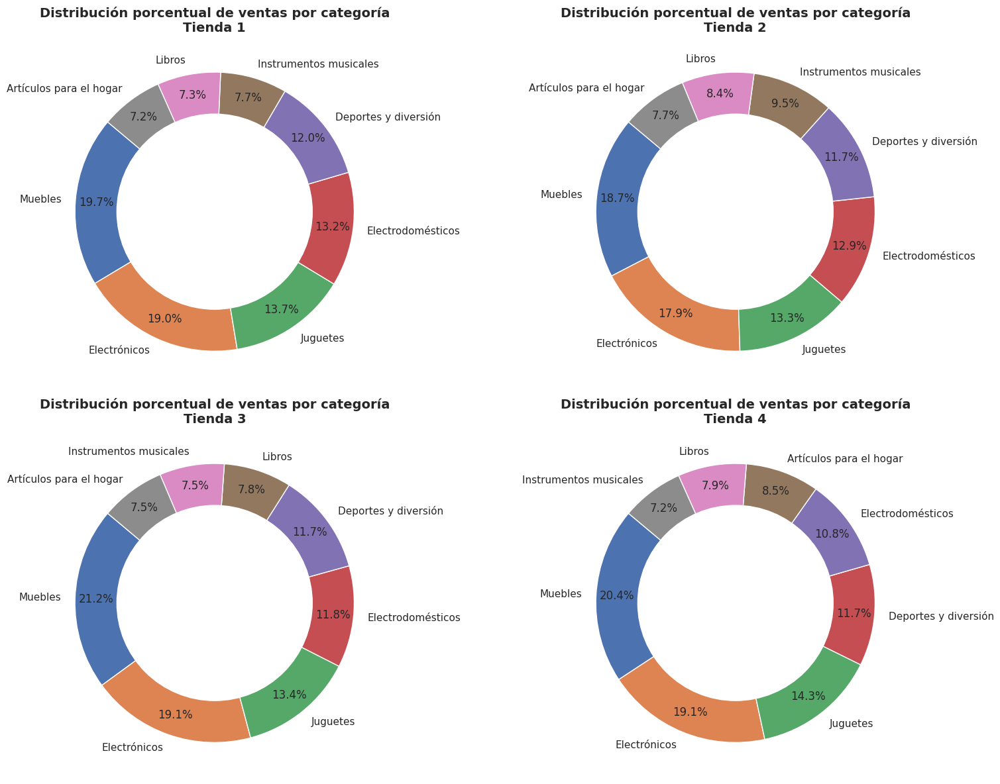

In [5]:
import matplotlib.pyplot as plt

# Lista con tus DataFrames y nombres para iterar fácilmente
tiendas_list = [
    (tienda, "Tienda 1"),
    (tienda2, "Tienda 2"),
    (tienda3, "Tienda 3"),
    (tienda4, "Tienda 4"),
]

plt.figure(figsize=(16, 12))

for i, (df, nombre) in enumerate(tiendas_list, 1):
    # Asegurarse de que 'Categoría del Producto' existe
    if 'Categoría del Producto' not in df.columns:
        raise ValueError(f"La columna 'Categoría del Producto' no existe en {nombre}")

    # Calcular cantidad de productos vendidos por categoría
    conteo = df['Categoría del Producto'].value_counts()

    # Porcentajes para el gráfico
    porcentajes = conteo / conteo.sum() * 100

    # Subplot para cada tienda
    plt.subplot(2, 2, i)
    plt.pie(
        porcentajes,
        labels=porcentajes.index,
        autopct='%1.1f%%',
        startangle=140,
        pctdistance=0.85
    )

    # Crear círculo blanco para dar forma de dona
    centro = plt.Circle((0, 0), 0.70, fc='white')
    plt.gca().add_artist(centro)

    plt.title(f'Distribución porcentual de ventas por categoría\n{nombre}', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


---

  ## 2.3. Gráfico: Evolución de ventas por categoría en el tiempo
  Muestra la tendencia de ventas de cada categoría de producto a lo largo del tiempo.

---

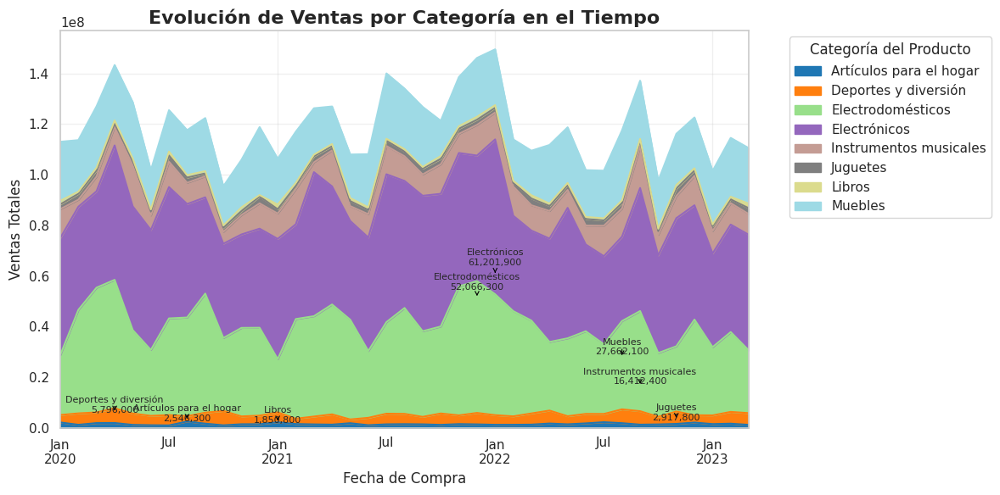

In [6]:
import matplotlib.pyplot as plt
import pandas as pd

# --- Crear DataFrame combinado de todas las tiendas ---
df_all = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

# Crear columna de Ventas
df_all["Ventas"] = df_all["Precio"] + df_all["Costo de envío"]

# Asegurar que la columna de fecha sea datetime
df_all["Fecha de Compra"] = pd.to_datetime(df_all["Fecha de Compra"], dayfirst=True, errors="coerce")

# Agrupar ventas por mes (fin de mes) y categoría
ventas_cat_mes = (
    df_all.groupby([pd.Grouper(key="Fecha de Compra", freq="ME"), "Categoría del Producto"])["Ventas"]
    .sum()
    .reset_index()
)

# Pivotear para usar en gráfico apilado
ventas_pivot = ventas_cat_mes.pivot(index="Fecha de Compra", columns="Categoría del Producto", values="Ventas")
ventas_pivot = ventas_pivot.fillna(0)

# Crear gráfico de área apilada
ax = ventas_pivot.plot(kind="area", stacked=True, figsize=(12, 6), colormap="tab20")

# Título y etiquetas
plt.title("Evolución de Ventas por Categoría en el Tiempo", fontsize=16, fontweight="bold")
plt.xlabel("Fecha de Compra", fontsize=12)
plt.ylabel("Ventas Totales", fontsize=12)
plt.legend(title="Categoría del Producto", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(alpha=0.3)

# Anotar el punto máximo de cada categoría
for categoria in ventas_pivot.columns:
    max_val = ventas_pivot[categoria].max()
    max_fecha = ventas_pivot[categoria].idxmax()
    ax.annotate(
        f"{categoria}\n{max_val:,.0f}",
        xy=(max_fecha, max_val),
        xytext=(max_fecha, max_val + max_val*0.05),
        ha="center",
        fontsize=8,
        arrowprops=dict(arrowstyle="->", color="black", lw=0.8)
    )

plt.tight_layout()
plt.show()


# 3. Calificación promedio de la tienda


---

  ## 3.1. Gráfico: Calificación promedio por tienda
  Nos permite visualizar qué tienda tiene la mayor calificación promedio.

---

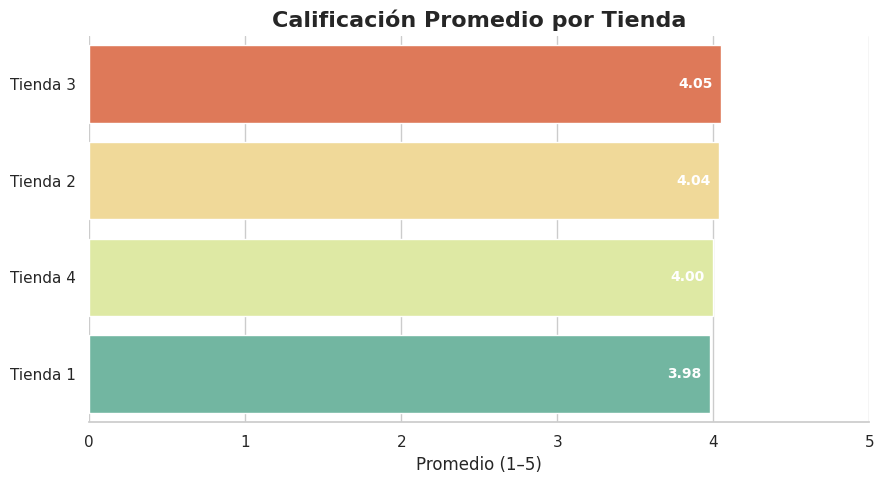

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Combinar tiendas con etiqueta ---
t1 = tienda.copy();  t1["Tienda"] = "Tienda 1"
t2 = tienda2.copy(); t2["Tienda"] = "Tienda 2"
t3 = tienda3.copy(); t3["Tienda"] = "Tienda 3"
t4 = tienda4.copy(); t4["Tienda"] = "Tienda 4"

df_tiendas = pd.concat([t1, t2, t3, t4], ignore_index=True)

# --- Calcular calificación promedio por tienda ---
calif_prom = (
    df_tiendas.groupby("Tienda", as_index=False)["Calificación"]
    .mean()
    .sort_values("Calificación", ascending=False)
)

# --- Gráfico de barras horizontales ---
sns.set_theme(style="whitegrid")
palette = sns.color_palette("Spectral", n_colors=len(calif_prom))

fig, ax = plt.subplots(figsize=(9, 5))
bars = sns.barplot(
    data=calif_prom,
    x="Calificación",
    y="Tienda",
    hue="Tienda",          # evita FutureWarning de seaborn
    palette=palette,
    dodge=False,
    ax=ax
)

# Quitar leyenda redundante
if ax.get_legend() is not None:
    ax.get_legend().remove()

# Anotar promedio dentro de cada barra
for i, (valor, tienda_lbl) in enumerate(zip(calif_prom["Calificación"], calif_prom["Tienda"])):
    ax.text(
        x=valor - 0.05, y=i,
        s=f"{valor:.2f}",
        va="center", ha="right",
        fontsize=10, fontweight="bold",
        color="white" if valor >= 3.0 else "black"
    )

# Estética final
ax.set_title("Calificación Promedio por Tienda", fontsize=16, fontweight="bold")
ax.set_xlabel("Promedio (1–5)")
ax.set_ylabel("")
ax.set_xlim(0, 5)
sns.despine(left=True, right=True, top=True)
plt.tight_layout()
plt.show()


---

  ## 3.2. Gráfico: Mapa geográfico - Calificación promedio por tienda.
  Nos permite ubicar tiendas según calificación promedio.

---

In [8]:
import pandas as pd
import folium
import matplotlib.colors as mcolors
from branca.colormap import LinearColormap

# --- Crear copias locales para evitar modificar DataFrames originales ---
t1 = tienda.copy();  t1['Tienda'] = 'Tienda 1'
t2 = tienda2.copy(); t2['Tienda'] = 'Tienda 2'
t3 = tienda3.copy(); t3['Tienda'] = 'Tienda 3'
t4 = tienda4.copy(); t4['Tienda'] = 'Tienda 4'

# --- Combinar todas las tiendas ---
df_todas = pd.concat([t1, t2, t3, t4], ignore_index=True)

# --- Calificación promedio por tienda y lugar ---
calif_promedio = df_todas.groupby(['Tienda', 'Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()

# --- Crear mapa centrado en Colombia ---
m = folium.Map(
    location=[4.6, -74.1],
    zoom_start=5,
    control_scale=True,
    tiles='OpenStreetMap'
)

# --- Colores por tienda ---
colores_tienda = {
    'Tienda 1': '#4682B4',
    'Tienda 2': '#DC143C',
    'Tienda 3': '#32CD32',
    'Tienda 4': '#9932CC'
}

colormaps_leyenda = {}
offset_step = 0.0015
offsets = {}

# --- Crear marcadores por tienda ---
for tienda_name, grupo in calif_promedio.groupby('Tienda'):
    fg = folium.FeatureGroup(name=tienda_name)

    min_cal = grupo['Calificación'].min()
    max_cal = grupo['Calificación'].max()

    base_color = mcolors.to_rgb(colores_tienda[tienda_name])
    lighter_color = tuple(min(1, c + 0.5) for c in base_color)

    cmap = LinearColormap(
        colors=[lighter_color, base_color],
        vmin=min_cal, vmax=max_cal,
        caption=f'{tienda_name} (Calificación)'
    )
    colormaps_leyenda[tienda_name] = cmap

    for _, row in grupo.iterrows():
        key = (row['lat'], row['lon'])
        if key not in offsets:
            offsets[key] = 0
        lat_offset = row['lat'] + offsets[key] * offset_step
        lon_offset = row['lon'] + offsets[key] * offset_step
        offsets[key] += 1

        color_rgb = cmap(row['Calificación'])

        folium.CircleMarker(
            location=[lat_offset, lon_offset],
            radius=6 + (row['Calificación'] - min_cal) * 2,
            color='white',
            weight=1,
            fill=True,
            fill_color=color_rgb,
            fill_opacity=0.9,
            popup=f"{row['Tienda']}<br>{row['Lugar de Compra']}<br>Calificación: {row['Calificación']:.2f}"
        ).add_to(fg)

    fg.add_to(m)

# --- Ajustar zoom para incluir todas las tiendas ---
lat_min, lat_max = calif_promedio['lat'].min(), calif_promedio['lat'].max()
lon_min, lon_max = calif_promedio['lon'].min(), calif_promedio['lon'].max()
m.fit_bounds([[lat_min, lon_min], [lat_max, lon_max]])

# --- Añadir leyenda interactiva ---
for cmap in colormaps_leyenda.values():
    cmap.add_to(m)

# --- Control de capas ---
folium.LayerControl(collapsed=False).add_to(m)

# --- Mostrar mapa ---
m


---

  ## 3.3. Gráfico: Calificación Promedio por Tienda y Categoría
  Nos permite visualizar la calificación promedio de los clientes para cada tienda y para cada categoría de producto, con el fin de evaluar la satisfacción del cliente en distintos segmentos de productos y comparar el desempeño entre tiendas.

---

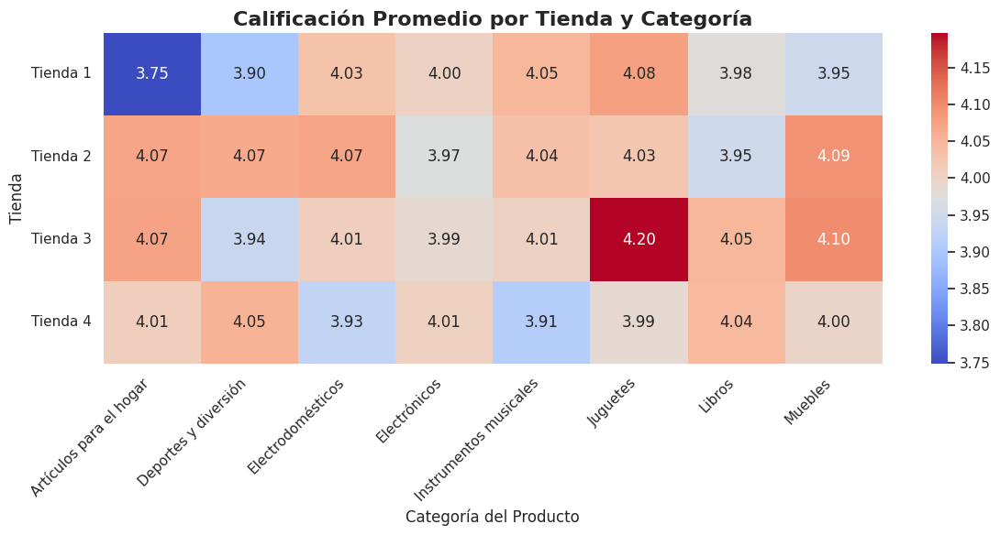

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# --- Crear copias locales para no modificar los DataFrames originales ---
t1 = tienda.copy();  t1["Tienda"] = "Tienda 1"
t2 = tienda2.copy(); t2["Tienda"] = "Tienda 2"
t3 = tienda3.copy(); t3["Tienda"] = "Tienda 3"
t4 = tienda4.copy(); t4["Tienda"] = "Tienda 4"

# --- Unir todas las tiendas ---
df_all = pd.concat([t1, t2, t3, t4], ignore_index=True)

# --- Calcular promedio de calificación por tienda y categoría ---
promedio = df_all.groupby(["Tienda", "Categoría del Producto"])["Calificación"].mean().reset_index()

# --- Crear tabla para heatmap ---
tabla = promedio.pivot(index="Tienda", columns="Categoría del Producto", values="Calificación")

# --- Graficar heatmap ---
plt.figure(figsize=(12, 6))
sns.heatmap(tabla, annot=True, cmap="coolwarm", fmt=".2f")

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.title("Calificación Promedio por Tienda y Categoría", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()


# 4. Productos más y menos vendidos

---

  ## 4.1. Gráfico: Top 5 productos más y menos vendidos por tienda
  Nos permite visualizar los 5 productos más vendidos y 5 menos vendidos por tienda.

---

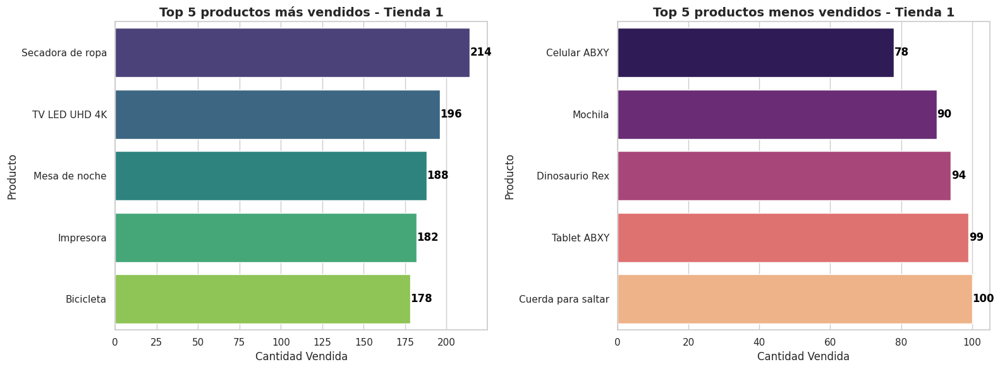

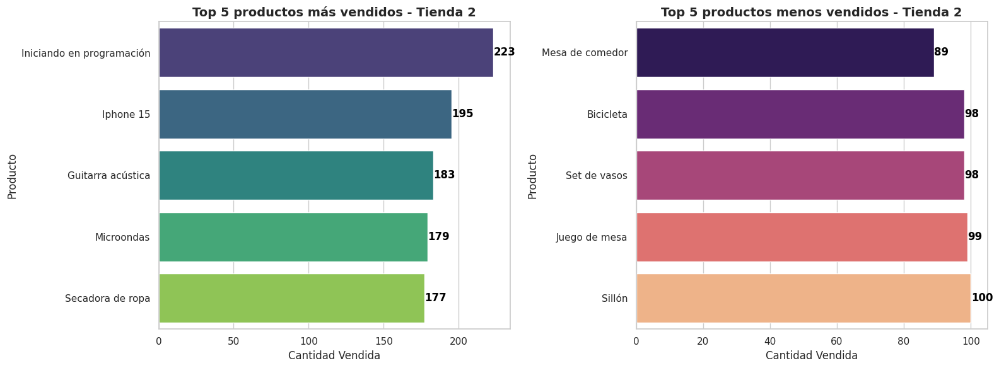

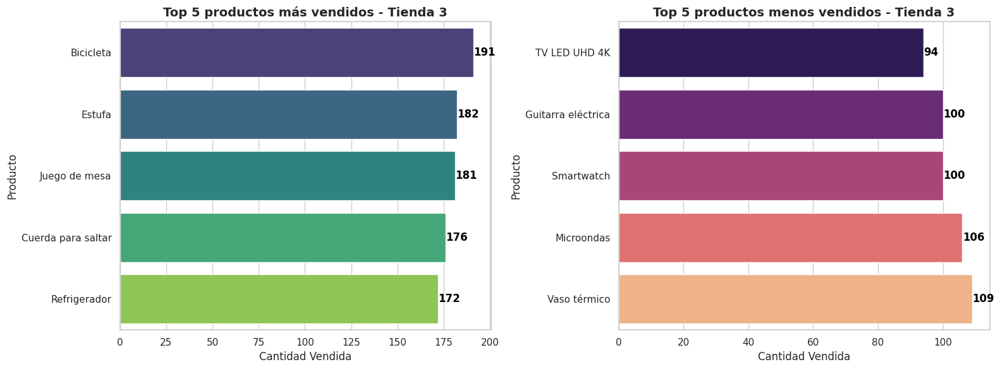

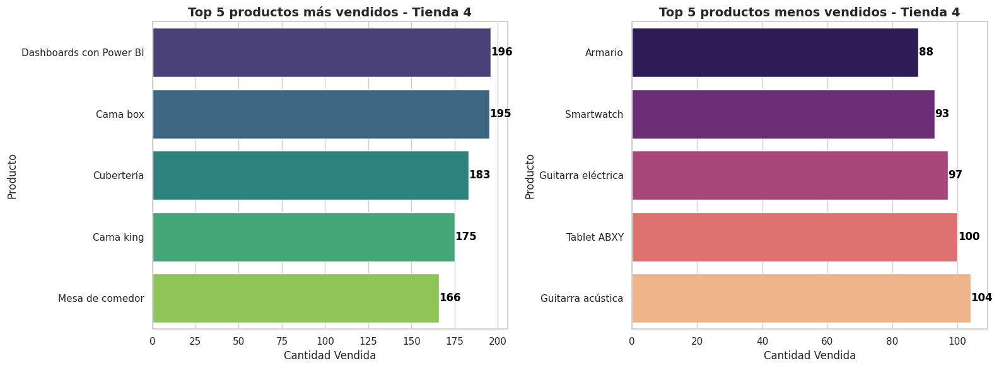

In [10]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")  # Ignorar FutureWarnings

# --- Crear copias locales para no modificar df_all original ---
df_local = df_all.copy()

# Calcular cantidad total vendida por producto y tienda
ventas_producto = df_local.groupby(['Tienda', 'Producto'])['Cantidad de cuotas'].sum().reset_index()
ventas_producto = ventas_producto.rename(columns={'Cantidad de cuotas': 'Cantidad Vendida'})

# Función para graficar top y bottom productos por tienda con valores en las barras
def graficar_top_bottom(tienda_df, top_n=5):
    tienda_nombre = tienda_df['Tienda'].iloc[0]

    top = tienda_df.sort_values('Cantidad Vendida', ascending=False).head(top_n)
    bottom = tienda_df.sort_values('Cantidad Vendida', ascending=True).head(top_n)

    fig, axes = plt.subplots(1, 2, figsize=(16,6))

    # Top productos
    sns.barplot(x='Cantidad Vendida', y='Producto', data=top, ax=axes[0], palette='viridis', dodge=False)
    axes[0].set_title(f'Top {top_n} productos más vendidos - {tienda_nombre}', fontsize=14, fontweight='bold')
    # Valores dentro de las barras
    for i, v in enumerate(top['Cantidad Vendida']):
        axes[0].text(v + 0.1, i, str(v), color='black', va='center', fontweight='bold')

    # Bottom productos
    sns.barplot(x='Cantidad Vendida', y='Producto', data=bottom, ax=axes[1], palette='magma', dodge=False)
    axes[1].set_title(f'Top {top_n} productos menos vendidos - {tienda_nombre}', fontsize=14, fontweight='bold')
    # Valores dentro de las barras
    for i, v in enumerate(bottom['Cantidad Vendida']):
        axes[1].text(v + 0.1, i, str(v), color='black', va='center', fontweight='bold')

    plt.tight_layout()
    plt.show()

# Graficar para cada tienda
for tienda_nombre in df_local['Tienda'].unique():
    df_t = ventas_producto[ventas_producto['Tienda'] == tienda_nombre]
    graficar_top_bottom(df_t)


# 5. Envío promedio por tienda

---

  ## 5.1. Gráfico: Costo de envío promedio por tienda
  Se puede observar cuál tienda tiene los envíos más caros y cuál los más económicos, lo que refleja distintas prácticas logísticas y operativas.

---

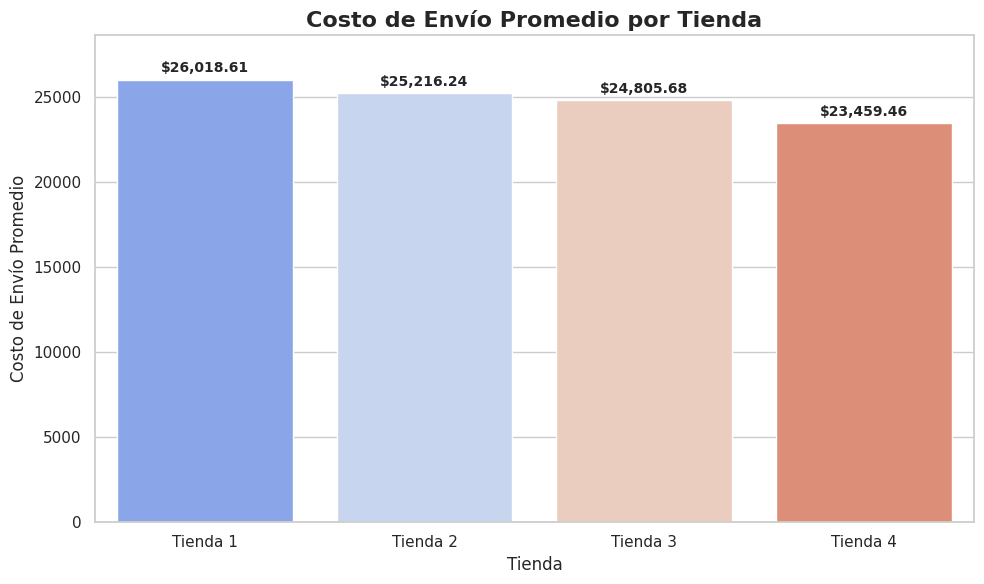

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Crear copia local para no alterar df_all
df_local = df_all.copy()

# Calcular envío promedio por tienda
envio_promedio = df_local.groupby('Tienda')['Costo de envío'].mean().reset_index()

# Ordenar de mayor a menor para ver cuál tienda gasta más
envio_promedio = envio_promedio.sort_values('Costo de envío', ascending=False)

# Gráfico de barras
plt.figure(figsize=(10,6))
sns.barplot(x='Tienda', y='Costo de envío', data=envio_promedio, palette='coolwarm')

# Agregar valores dentro de las barras
for i, v in enumerate(envio_promedio['Costo de envío']):
    plt.text(i, v + max(envio_promedio['Costo de envío'])*0.01, f"${v:,.2f}",
             ha='center', va='bottom', fontweight='bold', fontsize=10)

plt.title('Costo de Envío Promedio por Tienda', fontsize=16, fontweight='bold')
plt.ylabel('Costo de Envío Promedio')
plt.xlabel('Tienda')
plt.ylim(0, envio_promedio['Costo de envío'].max() * 1.1)  # espacio arriba
plt.tight_layout()
plt.show()


# 6. Resumen de tendencias por tienda:
Nos permite:
- Analizar tendencias de ventas por tienda a lo largo del tiempo.
- Evaluar la satisfacción del cliente y relacionarla con las ventas.
- Identificar oportunidades de optimización logística mediante el costo de envío.
- Tomar decisiones estratégicas basadas en desempeño integral de cada tienda.


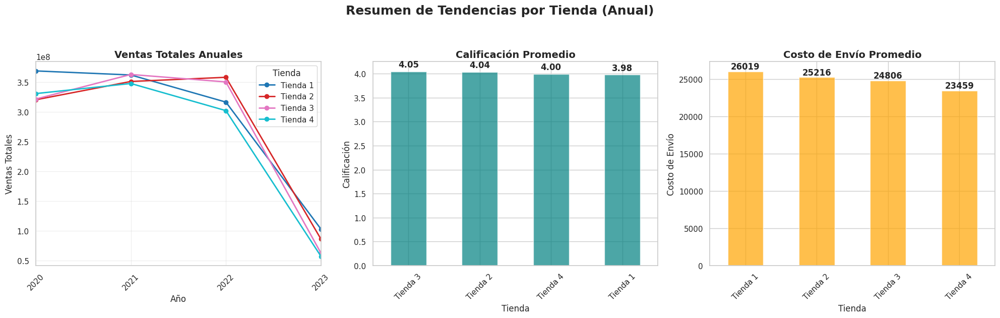

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear copia local para no alterar df_all original
df_local = df_all.copy()

# Convertir fecha a datetime
df_local["Fecha de Compra"] = pd.to_datetime(df_local["Fecha de Compra"], errors="coerce")
df_local["Ventas"] = df_local["Precio"]  # Asumimos que "Ventas" = "Precio"

# Agrupar datos
ventas_anual = df_local.groupby([pd.Grouper(key="Fecha de Compra", freq="Y"), "Tienda"])["Ventas"].sum().unstack()
calificacion_tienda = df_local.groupby("Tienda")["Calificación"].mean()
envio_tienda = df_local.groupby("Tienda")["Costo de envío"].mean()

# Crear figura con 3 subplots horizontales
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle("Resumen de Tendencias por Tienda (Anual)", fontsize=18, fontweight="bold", y=1.05)

# Ventas anuales por tienda (línea)
ventas_anual.plot(ax=axes[0], marker='o', linewidth=2, colormap='tab10')
axes[0].set_title("Ventas Totales Anuales", fontsize=14, fontweight="bold")
axes[0].set_xlabel("Año")
axes[0].set_ylabel("Ventas Totales")
axes[0].grid(alpha=0.3)
axes[0].tick_params(axis='x', rotation=45)

# Calificación promedio por tienda (barras)
calificacion_tienda_sorted = calificacion_tienda.sort_values(ascending=False)
calificacion_tienda_sorted.plot(kind="bar", ax=axes[1], color="teal", alpha=0.7)
axes[1].set_title("Calificación Promedio", fontsize=14, fontweight="bold")
axes[1].set_ylabel("Calificación")
axes[1].set_xlabel("Tienda")
axes[1].tick_params(axis='x', rotation=45)
for i, v in enumerate(calificacion_tienda_sorted):
    axes[1].text(i, v+0.05, f"{v:.2f}", ha="center", va="bottom", fontweight="bold")

# Costo de envío promedio por tienda (barras)
envio_tienda_sorted = envio_tienda.sort_values(ascending=False)
envio_tienda_sorted.plot(kind="bar", ax=axes[2], color="orange", alpha=0.7)
axes[2].set_title("Costo de Envío Promedio", fontsize=14, fontweight="bold")
axes[2].set_ylabel("Costo de Envío")
axes[2].set_xlabel("Tienda")
axes[2].tick_params(axis='x', rotation=45)
for i, v in enumerate(envio_tienda_sorted):
    axes[2].text(i, v+50, f"{v:.0f}", ha="center", va="bottom", fontweight="bold")

plt.tight_layout()
plt.show()


# 7. Informe final

# **Informe de Análisis de Desempeño de Tiendas**

**Introducción**

El presente informe analiza el desempeño de las cuatro tiendas de Alura Store, con el fin de determinar cuál de ellas debería considerarse para cerrar y liberar recursos para una nueva inversión.

**Objetivo**

Evaluar el desempeño de las cuatro tiendas y determinar cuál tienda debería considerarse para cerrar, basándose en facturación, popularidad de productos, satisfacción de clientes y costo de envío.

**Desarrollo del Análisis**

1. Facturación Total por Tienda

  - La Tienda 1 tiene la mayor facturación: 1.212.258.000 (precio + envío).
  - La Tienda 1 es la que más ingresos genera, seguida de Tienda 2, Tienda 3 y finalmente Tienda 4.
  - La Tienda 4 es la que tiene menor facturación:1.093.693.000.

2. Categoría más popular por tienda

  - Todas las tiendas tienen Muebles como categoría más vendida.
  - Cantidad de unidades vendidas en la categoría top:

    - Tienda 1: 465

    - Tienda 2: 442

    - Tienda 3: 499

    - Tienda 4: 480

  - Tienda 3 tiene la mayor cantidad de unidades vendidas en su categoría top (499), mientras que Tienda 2 tiene la menor (442).

3. Calificación Promedio por Tienda

  - Todas las tiendas tienen calificaciones por encima de 3.9, lo que indica satisfacción relativamente alta de los clientes.

  - Calificaciones por tienda:
   
    - Tienda 1: 3.977

    - Tienda 2: 4.037

    - Tienda 3: 4.048

    - Tienda 4: 3.996

  - La Tienda 3 tiene la calificación más alta (4.048), mientras que la Tienda 1 tiene la más baja (3.977), aunque la diferencia no es demasiado.

4. Productos más y menos vendidos por tienda

  - La Tienda 4 tiene varios productos con ventas bajas: entre 88 y 104 unidades.

  - Las tiendas 1 y 3 muestran mayor consistencia en sus top ventas: Tienda 3, por ejemplo, alcanza 499 unidades en su categoría top.

  - Observación: La baja rotación de productos en Tienda 4 genera una menor facturación.

5. Costo promedio de envío por tienda

  - La Tienda 4 tiene los envíos más económicos, lo que puede indicar un menor volumen de ventas.

  - En general, el costo de envío no compensa la baja facturación de la tienda.

  - La Tienda 4 tiene envíos más baratos, pero esto no compensa la baja facturación y rotación de productos.

**Conclusión**

Basado en los indicadores analizados, la Tienda 4 presenta el menor desempeño integral: menor facturación, menor rotación de productos y calificación promedio que no supera significativamente a las demás tiendas.

**Recomendación**

Se recomienda cerrar la Tienda 4 y utilizar sus recursos para invertir en un nuevo negocio, optimizando el retorno de inversión del grupo Alura Store.

**Justificación**

  - Facturación: Tienda 4 tiene la menor facturación total: 1.093.693.000.

  - Popularidad de productos: Aunque Muebles es su categoría más vendida, el volumen (480 unidades) es menor que la Tienda 3 (499 unidades).

  - Calificación promedio: 3.996, inferior a Tienda 2 y Tienda 3, apenas superior a Tienda 1.

  - Productos menos vendidos: Varios productos con ventas muy bajas (88–104 unidades), indicando baja rotación y escaso impacto en ingresos.

  - Costo de envío: Aunque más económico (23.459), no compensa la baja facturación y menor volumen de ventas.

En conclusión, los datos confirman que la Tienda 4 es la candidata ideal para cierre, ya que su aporte es limitado y sus recursos pueden aprovecharse mejor en operaciones más productivas.

-- --


# 8. Extra: Análisis del desempeño geográfico

---

  ## Gráfico - Mapa interactivo: Distribución geográfica de ventas por tienda con información de producto y calificación
  Permite presentar patrones geográficos de ventas, identificar concentraciones por tienda y analizar regiones donde la tienda tiene mejor desempeño.

---

In [13]:
import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Crear copia local para no alterar df_all original
df_local = df_all.copy()

# Centro del mapa: promedio de latitud y longitud
map_center = [df_local['lat'].mean(), df_local['lon'].mean()]
mapa = folium.Map(location=map_center, zoom_start=5)

# Cluster de marcadores para agrupar puntos cercanos
marker_cluster = MarkerCluster().add_to(mapa)

# Colores por tienda
colores = {
    'Tienda 1': 'blue',
    'Tienda 2': 'green',
    'Tienda 3': 'purple',
    'Tienda 4': 'orange'
}

# Agregar marcadores
for _, row in df_local.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        color=colores.get(row['Tienda'], 'gray'),
        fill=True,
        fill_opacity=0.7,
        popup=(
            f"<b>Producto:</b> {row['Producto']}<br>"
            f"<b>Tienda:</b> {row['Tienda']}<br>"
            f"<b>Precio:</b> ${row['Precio']:.0f}<br>"
            f"<b>Calificación:</b> {row['Calificación']}<br>"
            f"<b>Ciudad:</b> {row['Lugar de Compra']}"
        )
    ).add_to(marker_cluster)

# Mostrar mapa
mapa
